# Students Case Study
### Short story
The end of school year is very close and Martin - very ambitious student - wants to know how he performs in his class. He got somehow the data about average grades from every subject of all his colleagues. Now he needs to create a ranking of the students and check which rank he has. Luckily for him the TOPSIS method was invented, so he can use it. To make life simpler he decided to use MSDTransformer library - which was also created by a group of very ambitious students - a tool, which allows him to create a ranking based on TOPSIS method and MSD space.

### Read the data
The first step is to read the data and convert them to pandas DataFrame.

In [1]:
import pandas as pd

students = pd.read_csv("../data/students.csv", sep = ';', index_col = 0)
display(students)

,Math,Bio,Art
StudentID,,,
U1,0.00,1.00,1.00
U2,33.33,2.67,2.67
U3,50.00,3.50,3.50
U4,66.67,4.33,4.33
U5,100.00,6.00,6.00
U6,20.00,2.25,3.75
U7,67.64,2.50,3.62
U8,45.00,4.75,5.00
U9,0.00,2.25,4.75


In Martin's class there are 19 students. Each of them has average marks from 3 subjects: Mathematics, Biology and Art. Math's grades are in range 0-100, while Biology's and Art's grades are in range 1-6. In Marin's school's system the bigger the grade is, the better.

### Define objectives, weights and expert_range
Now Martin can define an objective function for each subject - that means that he can provide an information which grades are cost type and which are gain type. In his school the greater the grade is the better, so each of them is a gain type criterion.

In [2]:
objectives = {
    "Math": 'gain',
    "Bio" : 'gain',
    "Art" : 'gain'
}

Each of the subjects has the same weight as others, therefore there is no need to define weights.

The MSDTransformer library by default takes minimal and maximal value as a range for each criterion. However there is also on option to provide custom ranges. Martin decided to do it and he defined his own ranges.

In [3]:
expert_range = {
    "Math": [0, 100],
    "Bio" : [1, 6],
    "Art" : [1, 6]
}

### Create a ranking
Finally, when everything is defined, Martin can create a ranking. To do it, at first he need to create an object of MSDTransformer class. He need to decide also which function the library should use to deal with students, who has the same mean of all their grades.

In [4]:
import MSDTransformer as msdt

agg_function = msdt.ATOPSIS
students_obj = msdt.MSDTransformer(agg_function)

Then he can run the fit_transform() method, which will fit the data and calculate the ranking scores for each of the students.

In [5]:
students_obj.fit_transform(X = students, objectives = objectives,  expert_range = expert_range)

,Math,Bio,Art,Mean,Std,AggFn
StudentID,,,,,,
U1,0.0000,0.000,0.000,0.000000,0.000000,0.000000
U2,0.3333,0.334,0.334,0.333767,0.000330,0.333767
U3,0.5000,0.500,0.500,0.500000,0.000000,0.500000
U4,0.6667,0.666,0.666,0.666233,0.000330,0.666233
U5,1.0000,1.000,1.000,1.000000,0.000000,1.000000
U6,0.2000,0.250,0.550,0.333333,0.154560,0.367423
U7,0.6764,0.300,0.524,0.500133,0.154589,0.523480
U8,0.4500,0.750,0.800,0.666667,0.154560,0.684349
U9,0.0000,0.250,0.750,0.333333,0.311805,0.456435


To see the results of created ranking, Martin needs to use show_ranking() method.

In [6]:
students_obj.show_ranking()

,Rank,Math,Bio,Art
StudentID,,,,
U5,1,1.0000,1.000,1.000
U16,2,1.0000,1.000,0.150
U18,3,1.0000,1.000,0.000
U15,4,0.0900,0.910,1.000
U11,5,0.2500,0.750,1.000
U8,6,0.4500,0.750,0.800
U4,7,0.6667,0.666,0.666
U14,8,0.0000,0.500,1.000
U10,9,0.6299,0.800,0.070


Martin can also look on this ranking in form of 2D chart, showing the position of each student in MSD space. To do is, he need to run plot() method.

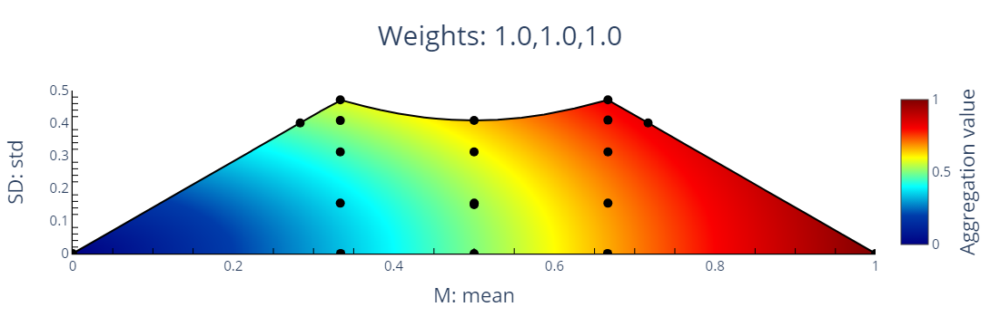

In [7]:
students_obj.plot()

### Show potential improvement actions
Martin is not satisfied with his current position. His student's ID is U4 so from the ranking he can read that his rank is 7. He wants to be at least better than his class enemy Claudia, whose student's ID is U18 and she occupies 3rd position. Martin doesn't have much time, so he need to know how to improve his position with at least amount of work as possible. Morover Martin knows that there is no chance for him to improve his Art's grade. The improvement_features() method will be here the best choice.

In [8]:
import numpy as np

martin_pos = 7-1
claudia_pos = 3-1
grades_to_change = ['Math', 'Bio']
improvement_ratio = 0.01

students_obj.improvement(
    'improvement_features', 
    alternative_to_improve=martin_pos,
    alternative_to_overcome=claudia_pos,
    improvement_ratio=improvement_ratio,
    features_to_change=grades_to_change
)

,Math,Bio,Art
0,33.33,0.42,0.0


Now Martin knows, that to beat the Claudia, he needs to improve his Math's grade by 33.33 and his Biology's grade by 0.42.